In [1]:
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict

def draw_board(paths, circuit_matrix, nets=None, save_name="test.jpg", clayer=0, via=False):
    
    # convert paths
    paths_x = []
    paths_y = []
    paths_z = []

    for path in paths:
        x_tmp = []
        y_tmp = []
        z_tmp = []
        for n in path:
            x_tmp.append(n[0])
            y_tmp.append(n[1])
            z_tmp.append(n[2])
        paths_x.append(x_tmp)
        paths_y.append(y_tmp)
        paths_z.append(z_tmp)

    width, height, layer = len(circuit_matrix), len(circuit_matrix[0]), len(circuit_matrix[0][0])
    fig = plt.figure(figsize=[width/4, height/4])

    ax = fig.add_subplot(111)

    # draw the grid
    for x in range(width):
        ax.plot([x, x], [0,height-1], color=(0.5,0.5,0.5,1))
    for y in range(height):
        ax.plot([0, width-1], [y,y], color=(0.5,0.5,0.5,1))

    # draw paths
    for p in range(len(paths_x)):

        if paths_x[p]:

            layer_path_x = defaultdict(list)
            layer_path_y = defaultdict(list)
            layer_idx = paths_z[p][0]
            tmp_x = []
            tmp_y = []
            for i, p_t in enumerate(paths_z[p]):
                if p_t==layer_idx:
                    tmp_x.append(paths_x[p][i])
                    tmp_y.append(paths_y[p][i])
                if p_t!=layer_idx or i==len(paths_z[p])-1:
                    layer_path_x[layer_idx].append(tmp_x)
                    layer_path_y[layer_idx].append(tmp_y)
                    tmp_x = [paths_x[p][i]]
                    tmp_y = [paths_y[p][i]]
                    layer_idx = p_t

            ph = plt.subplot()
            for idx in layer_path_x:
                color = "black"
                if idx==0:
                    color = "red"
                    alpha = 1.0
                elif idx==1:
                    color = "green"
                    alpha = 0.5
                elif idx==2:
                    color = "yellow"
                    alpha = 0.5
                elif idx==3:
                    color = "blue"
                    alpha = 0.5
                else:
                    color = "red"
                    alpha = 0.5
                for i in range(len(layer_path_x[idx])):
                    ph.plot(layer_path_x[idx][i], layer_path_y[idx][i], alpha=alpha, linewidth=5, color=color)

    # draw net number

    for x in range(width):
        for y in range(height):
            if not via:
                val = circuit_matrix[x][y][clayer]
                if val != 0:
                    ax.text(x, y, str(int(circuit_matrix[x][y][clayer])), fontsize=18, color='w',
                        horizontalalignment='center', verticalalignment='center')
            else:
                val = circuit_matrix[x][y][clayer]
                if val != 0:
                    ax.text(x, y, str(int(circuit_matrix[x][y][clayer])), fontsize=18, color='w',
                            horizontalalignment='center', verticalalignment='center')
    permenent_x = []
    permenent_y = []
    for x in range(width):
        for y in range(height):
            if not via and circuit_matrix[x][y][clayer] is None:
                permenent_x.append(y)
                permenent_y.append(x)
            elif via and circuit_matrix[x][y][clayer] is None:
                permenent_x.append(y)
                permenent_y.append(x)
    ax.scatter(permenent_y, permenent_x, marker='s', s=250, c='k')

    permenent_x = []
    permenent_y = []
    for x in range(width):
        for y in range(height):
            if not via and circuit_matrix[x][y][clayer] != 0:
                permenent_x.append(y)
                permenent_y.append(x)
            elif via and circuit_matrix[x][y][clayer] != 0:
                permenent_x.append(y)
                permenent_y.append(x)
    ax.scatter(permenent_y, permenent_x, marker='s', s=250, c='b')

    # scale the axis area to fill the whole figure
    ax.set_position([0,0,1,1])

    # get rid of axes and everything (the figure background will show through)
    # ax.set_axis_off()

    # scale the plot area conveniently (the board is in 0,0..18,18)
    ax.set_xlim(0,width-1)
    ax.set_ylim(0,height-1)
    
    fig.savefig(save_name)


0 [41 37  0 34 37  0] [(34, 22, 0), (34, 32, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [42 37  0 34 37  0] [(34, 22, 0), (34, 32, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [43 37  0 34 37  0] [(34, 22, 0), (34, 32, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [44 37  0 34 37  0] [(34, 22, 0), (34, 32, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [45 37  0 34 37  0] [(34, 22, 0), (34, 32, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
to_next_pair
0 [34 37  0 34 32  0] [(34, 22, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [35 37  0 34 32  0] [(34, 22, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [36 37  0 34 32  0] [(34, 22, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [37 37  0 34 32  0] [(34, 22, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [38 37  0 34 32  0] [(34, 22, 0), (12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [39 37  0 34 32  0] [(34, 22, 0), (12, 1

/tmp/ipykernel_4398/2233534048.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=[width/4, height/4])


0 [38 32  0 34 22  0] [(12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [39 32  0 34 22  0] [(12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [40 32  0 34 22  0] [(12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [41 32  0 34 22  0] [(12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [42 32  0 34 22  0] [(12, 12, 0), (12, 12, 1), (12, 12, 2), (12, 12, 3)]
to_next_pair
0 [34 22  0 12 12  0] [(12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [35 22  0 12 12  0] [(12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [36 22  0 12 12  0] [(12, 12, 1), (12, 12, 2), (12, 12, 3)]
0 [37 22  0 12 12  0] [(12, 12, 1), (12, 12, 2), (12, 12, 3)]


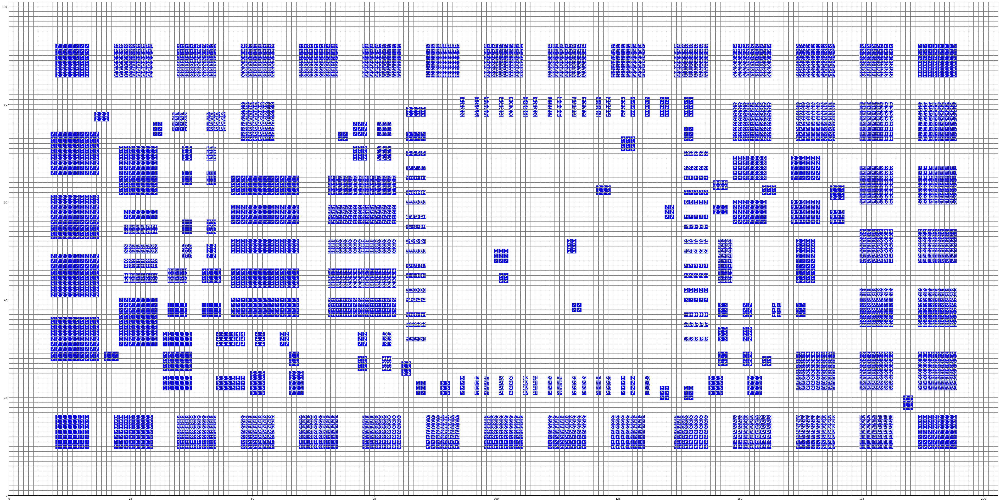

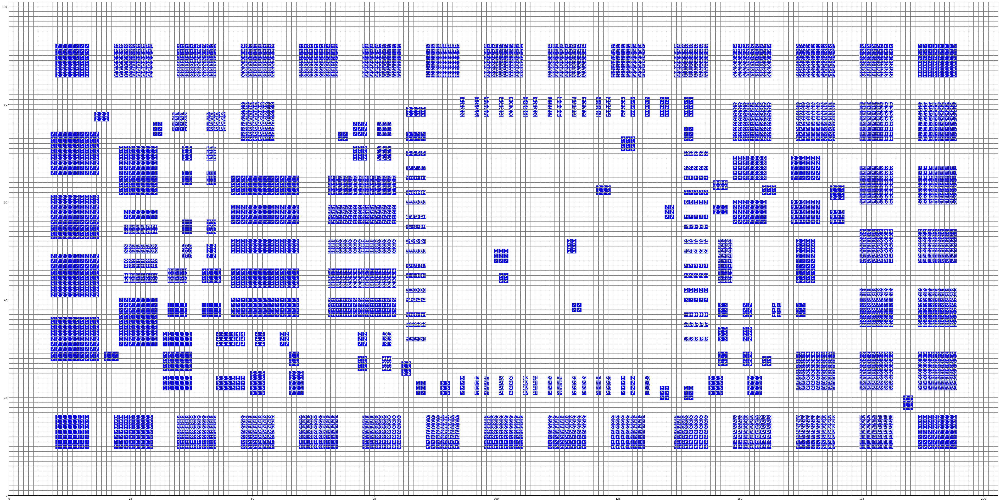

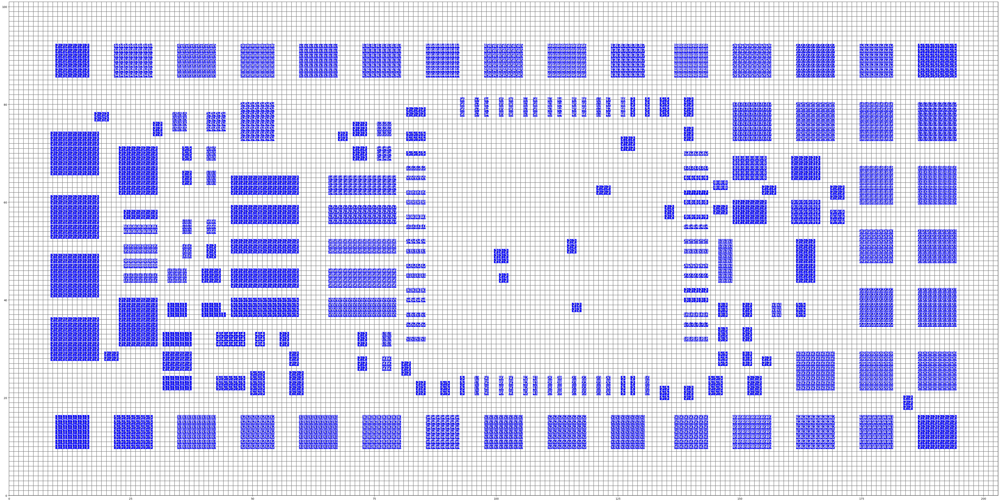

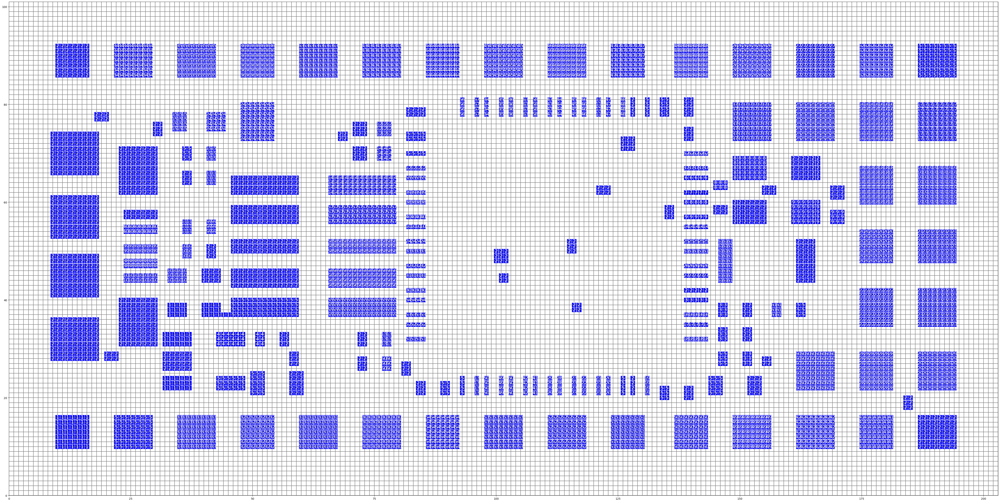

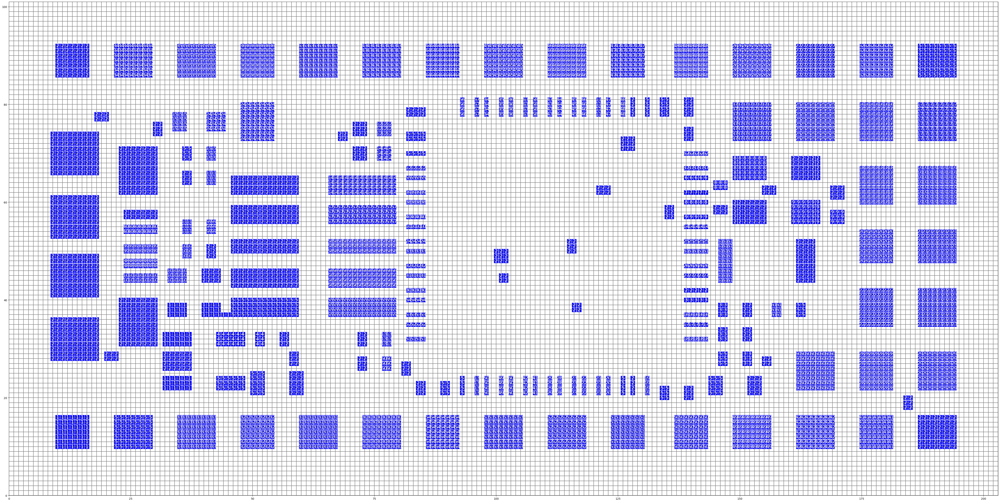

...

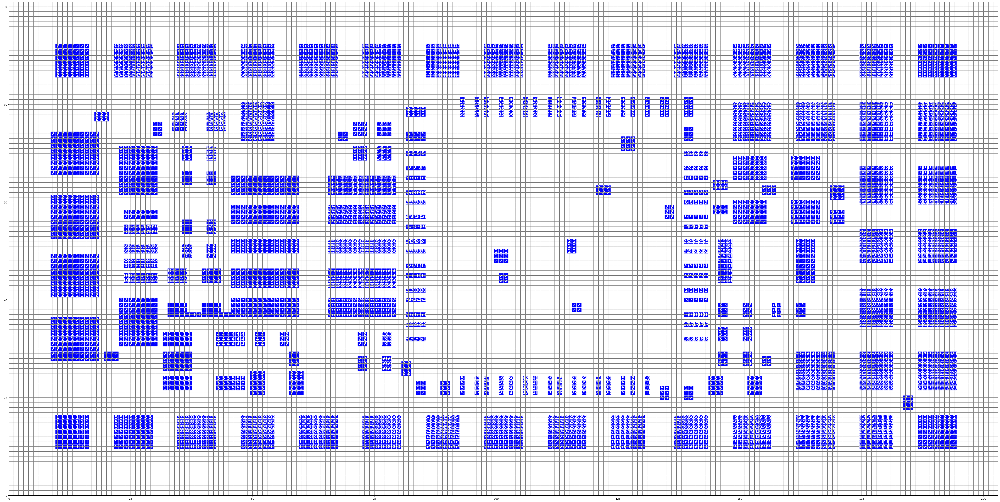

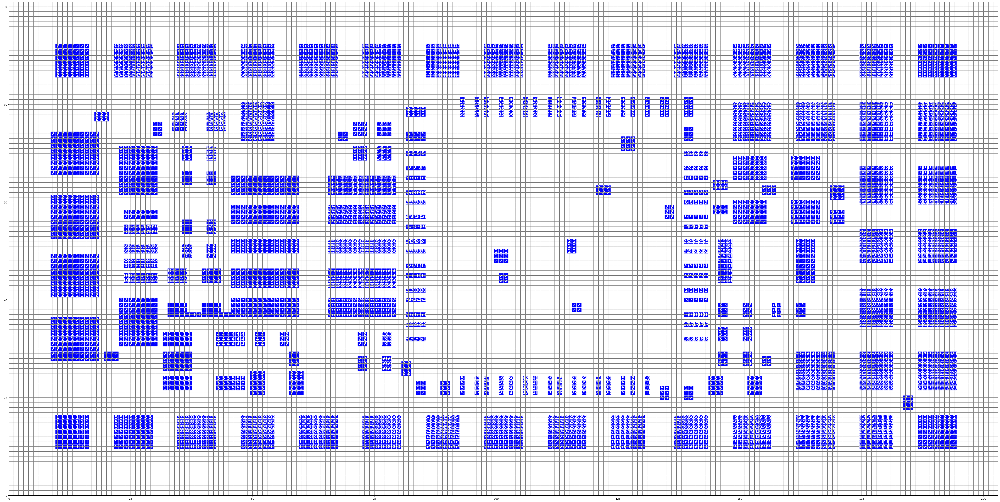

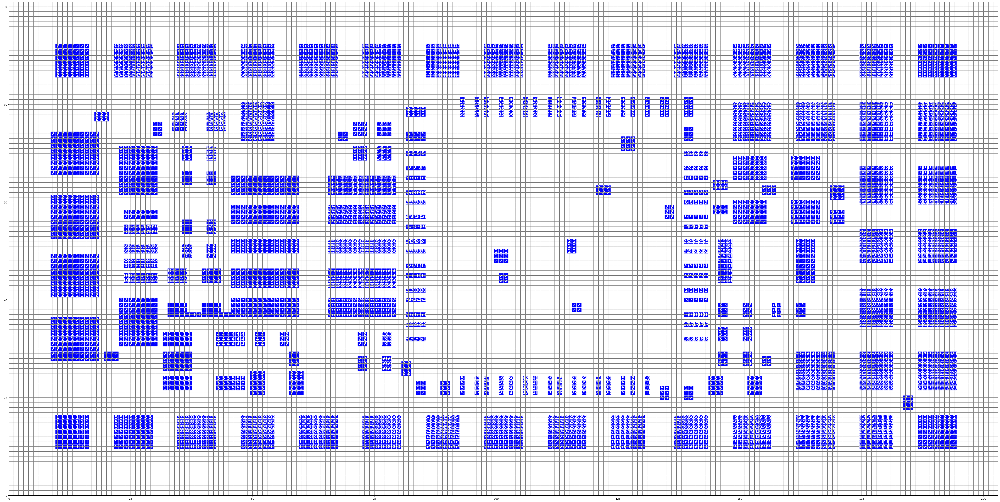

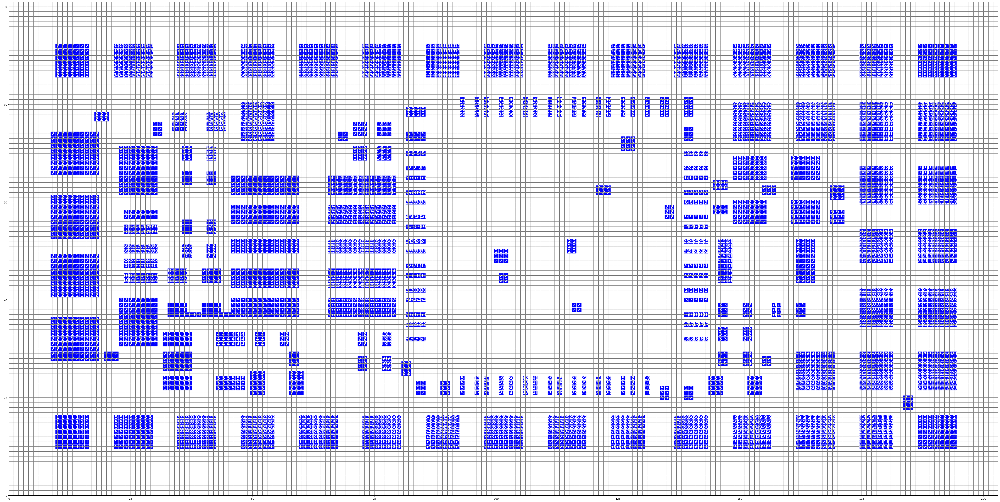

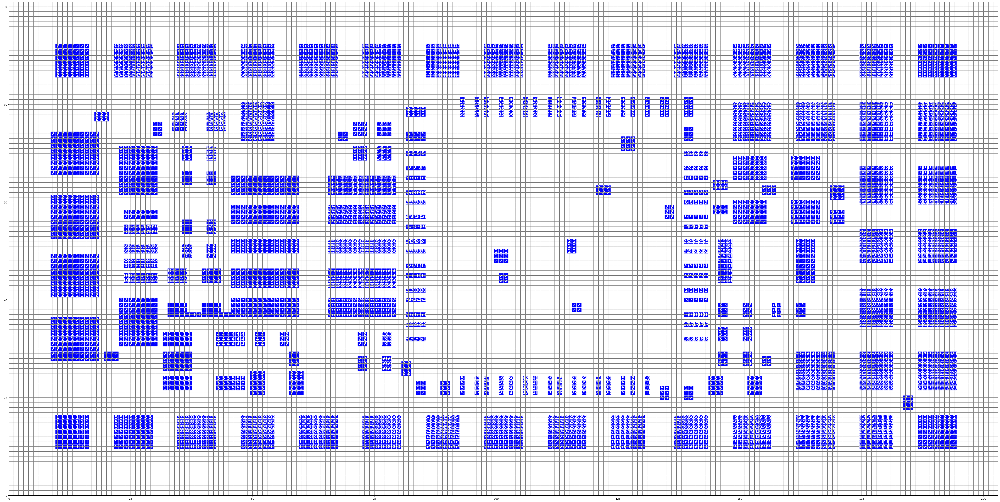

Error in callback <function flush_figures at 0x7f65b088df70> (for post_execute):


KeyboardInterrupt: 

In [4]:
from PCBEnvPos import PCBEnvPos
import random

resolution = [0.2, 0.2]
pcb_folder = '../../PCBs/'
pcb_names = ["1Bitsy_1bitsy"]
termination_rule = "vr"
iters = 30

env = PCBEnvPos(
    resolution=resolution, 
    pcb_folder=pcb_folder, 
    pcb_names=pcb_names, 
    termination_rule=termination_rule
)

obs, _ = env.reset()
for i in range(iters):
    act = 0
    print(act, obs, env.nets[1])
    obs, rew, term, _, info = env.step(act)
    draw_board(paths=[], circuit_matrix=env.pcb_matrix, clayer=0, save_name=f"test{i}.jpg")
    if term:
        env.reset()
